# RA2CE Examples

This notebook contains examples for the RA2CE model. This notebook should be used in combination with the 'examples' folder, which contains pre-processed data. A user could create their own examples, using the RA2CE functionality of their interest. This requires the right folder setup, and the correct settings in the configuration files (network.ini and analyses.ini)

In this notebook, we will guide you through some of the RA2CE functionality, give insight into the output and provide examples on how these outputs can be used in different contexts. 

The detailed documentation can be accessed : ....

First of all, we will import the packages we need to execute this notebook:

In [20]:
import ast
import random
import sys
import webbrowser
import geopandas as gpd
from IPython.display import display
import matplotlib.pyplot as plt
from matplotlib.pyplot import get_cmap
from matplotlib.colors import to_hex
from pathlib import Path
import rasterio

Then, we will do some basic settings. Keep in mind that you will have to specify the path to your local machine yourself.
First, we will set the path to the ra2ce folder and we will initialize the names for the network.ini and analysis.ini files

In [3]:
sys.path.append(r'C:\python\ra2ce\ra2ce') # path to the ra2ce folder on your local machine

from ra2ce.ra2ce_handler import Ra2ceHandler #import the ra2cehandler to run ra2ce analyses

_network_ini_name = "network.ini" #set the name for the network.ini
_analysis_ini_name = "analysis.ini" #set the name for the analysis.ini

Now let's find the examples folder on your machine

In [4]:
folder_dir = Path(r'C:\python\examples\examples') #Set the path to your examples folder

# Folder structure

Before starting the examples, it is vital that you familiarize yourself with the RA2CE folder structure. RA2CE requires this folder structure to succesfully perform analyses. You can find the folder structure in the **documentation (...)**


A project folder must contain the following subfolders: input, output, and static. It must also contain the network.ini and analyses.ini files. Within the subfolder static, RA2CE expects three subfolders: hazard, network, and output_graph. See below an example folder structure of “Project A”. This folder structure must be created and filled with data by the user before running RA2CE.

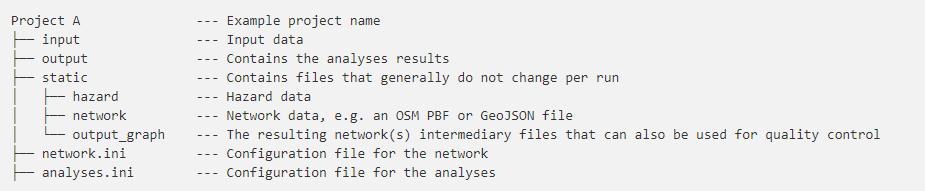

For this example notebook, there is an example folder available with the correct folder structures. 

## Configuring a road network from OSM

A first functionality of RA2CE is extracting road networks from OpenStreetMap (OSM) for any place in the world. You can do this, by creating a polygon of the area you would like to extract the road network from.

An easy way to use this option is by drawing a polygon at the location of choice at [geojson.io](http://geojson.io/). 
Another option is creating a polygon layer in a GIS and saving it as a .geojson

Bear in mind that RA2CE requires a polygon in **.geojson** format.

The projection should be set to **WGS84 EPSG:4326**

The created polygon should be saved in the **static / network** folder.


*OSM files are usually neater because they are checked before uploading. When using this type of file, segmentations happen automatically.* 
 

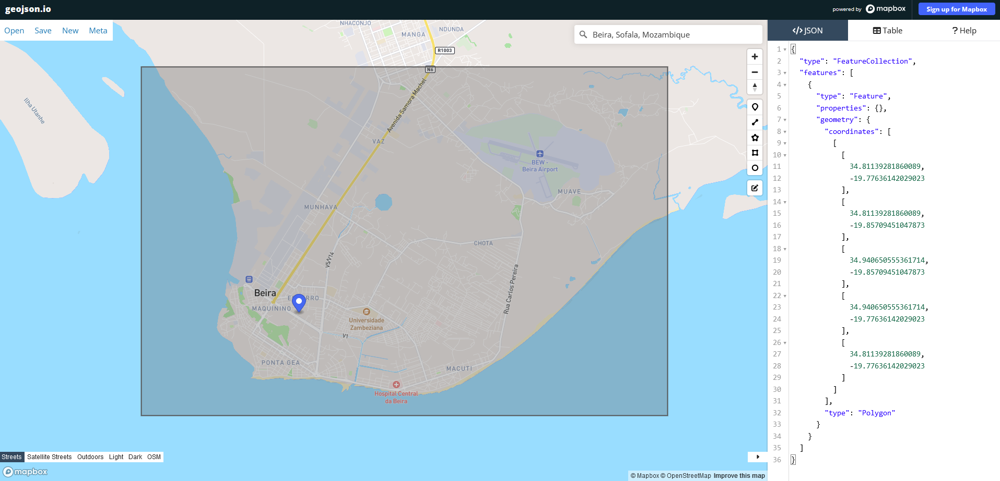

Now, specify the file's name in the **'polygon' parameter** in the **network.ini** file in the [network] section. Here, you specify the name of your created .geojson polygon, which you have saved in the network folder that belongs to your project.

Then, you specify the source of road network extraction. In the case of using a .geojson polygon, you want to perform an **OSM download**.
With the **road_types** parameter, you can specify the types of roads (motorway - residential) you want to extract from OSM.
Bear in mind that the more road types you include, the more complicated your road network. This can increase computational time.

> [project]<br>
name = beira<br>
<br>
[network]<br>
directed = False<br>
**source = OSM download<br>**
primary_file = None<br>
diversion_file = None<br>
file_id = rfid_c<br>
**polygon = Extent_Network_wgs84.geojson<br>**
network_type = drive<br>
**road_types = motorway,motorway_link,primary,primary_link,secondary,secondary_link,tertiary,tertiary_link,residential<br>**
save_shp = True<br>
<br>
*[origins_destinations]<br>
origins = None<br>
destinations = None<br>
origins_names = A<br>
destinations_names = B<br>
id_name_origin_destination = OBJECTID<br>
origin_count = PEOPLE<br>              
origin_out_fraction = 1<br>
<br>
[hazard]<br>
hazard_map = None<br>
hazard_id = None<br>
hazard_field_name = waterdepth<br>
aggregate_wl = max<br>
hazard_crs = None $EPSG:4326 <br>
<br>
[cleanup]<br>
snapping_threshold = None <br>
segmentation_length = None <br>
merge_lines = True <br>
merge_on_id = False <br>
cut_at_intersections = False <br>*

Now, we tell the program where to find our project folder (by specifying the path to the project folder). Now that we introduced a polygon of a region, we specified the road types and that we want an OSM download, RA2CE can perform this action for us. For this action we only need the network.ini file, no analysis.ini file is needed

In [6]:
root_dir = folder_dir /"beira_graph_configuration" #specify the path to the project folder in the examples folder
network_ini = root_dir / _network_ini_name #we set the network_ini_name before, so we can use this now for the project
assert network_ini.is_file() #check whether there is a network.ini

Run RA2CE and configure (create) the network. We input no analysis.ini for now, including the sets of interest analysis.

In [109]:
handler = Ra2ceHandler(network=network_ini, analysis=None)
handler.configure()

2023-06-20 08:17:38 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:17:38 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:17:38 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:17:38 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:17:38 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:17:38 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:17:38 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:17:38 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:17:38 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:17:38 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:17:38 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:17:38 A

Now, let's inspect the created network.<br>
Note: the road network is always saved in the static/output_graph folder.<br> 
First, we load the right geopackage. There are many geopackages created in the static / output_graph folder. These all represent some properties of the network. Let's inspect some of these.

*Notice the different files in the output_graph folder. You can inspect them all and see what their differences are.* 

In [7]:
#Set the path to YOUR output_graph folder to find the network/graph creation:
path_output_graph = root_dir/"static"/"output_graph"

In [8]:
#Now we find and inspect the file 'base_graph_edges.gpkg which holds the 'edges' of the network. 
#An edge (or link) of a network (or graph) is one of the connections between the nodes (or vertices) of the network. More information on: https://mathinsight.org/definition/network_edge#:~:text=An%20edge%20(or%20link)%20of,in%20the%20first%20figure%20below.
base_graph_edges = path_output_graph/"base_graph_edges.gpkg"
edges_gdf = gpd.read_file(base_graph_edges, driver = "GPKG")
edges_gdf.head()

,osmid,name,highway,maxspeed,oneway,length,rfid_c,rfid,avgspeed,time,junction,bridge,lanes,ref,u,v,key,geometry
0,820923407,Ava Mártires da Revolução,tertiary,60,False,70.0,1764,1209,60.0,4.0,nan,nan,nan,nan,567924681,1934771035,0,"LINESTRING (34.87673 -19.85047, 34.87737 -19.8..."
1,44785078,nan,tertiary,nan,True,70.0,"[80, 1, 10916]",2,59.0,4.0,nan,nan,nan,nan,567924681,4095037852,0,"LINESTRING (34.87673 -19.85047, 34.87642 -19.8..."
2,44785077,nan,tertiary,nan,True,71.0,"[10917, 79, 47]",19,59.0,4.0,nan,nan,nan,nan,567924681,567929920,0,"LINESTRING (34.87606 -19.85055, 34.87628 -19.8..."
3,326208102,nan,residential,nan,False,132.0,"[3712, 3809, 3775]",2274,60.0,8.0,nan,nan,nan,nan,567924698,3328284864,0,"LINESTRING (34.89312 -19.79809, 34.89331 -19.7..."
4,"[839392844, 839392845]",Rua Carlos Pereira,secondary,60,False,754.0,"[11256, 3893, 21, 11224, 11258, 27, 5791]",7,60.0,45.0,nan,nan,nan,nan,567924698,567924713,0,"LINESTRING (34.89980 -19.80126, 34.89942 -19.8..."


Notice how the road network that is downloaded holds the attributes of all these road types that are specified in the network.ini: motorway,motorway_link,primary,primary_link,secondary,secondary_link,tertiary,tertiary_link,residential.

If you want to customize this yourself, you can pick the type of roads you are interested in by choosing from this list. 
For example using only motorway and motorway_link.

In [9]:
edges_gdf.explore(column='highway', tiles="CartoDB positron")

*If you want to get a bit more advanced, use the 'Disconnected Islands' plugin in QGIS to check whether the road network is completely connected. If there are disconnected islands in the road network, this can impact more advanced RA2CE analyses (such as OD-analyses which are introduced later)*

Now we find and inspect the file 'base_graph_nodes.gpkg which holds the 'nodes' of the network. A node is basically the beginning and end point of an edge. Together, the nodes and edges make up the graph/network

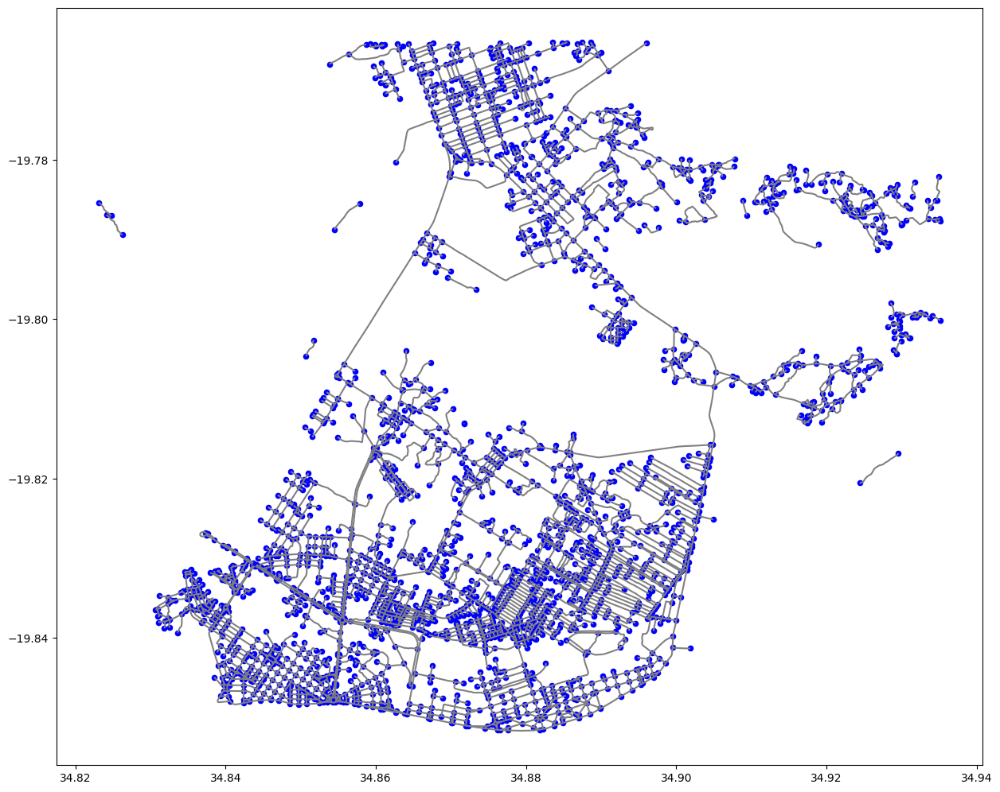

In [116]:
base_graph_nodes = path_output_graph/"base_graph_nodes.gpkg" #specify where to find the nodes file
nodes_gdf = gpd.read_file(base_graph_nodes, driver = "GPKG") #read in the nodes file


#Plotting nodes and edges together
fig, ax = plt.subplots(figsize=(15, 15))  # Set the figsize as desired
# Set the edges as the base plot
baseplot = edges_gdf.plot(ax=ax, color='grey')
nodes_gdf.plot(ax=baseplot, color='blue', markersize=20)
plt.show()


# Single redundancy test

Now, we will look into the analyses.ini. The single link redundancy analyses is an analysis specific for criticality of road networks. It provides insight into the redundancy / criticality of the network. The following analysis removes each link of the network one at a time. For each disrupted link, a redundancy analysis is performed. It identifies the best existing alternative route or, if there is no redundancy, the lack of alternative routes. This is performed sequentially for each link of the network. 

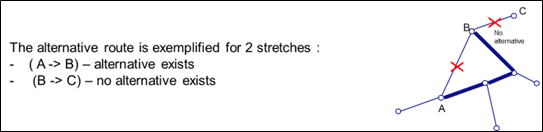

In this example, we perform this analysis for the road network of Beira which we created before. First, we initialise analysis.ini. The relevant function for this type of analysis is single_link_redundancy. You can call this RA2CE function using the analyses.ini. The redundancy of each link is expressed in the total distance (weighing) for the alternative route.

> [project] <br>
name = beira <br>
 <br>
[analysis1] <br>
name = beira_redundancy <br>
analysis = single_link_redundancy <br>
weighing = distance <br>
save_shp = True <br>
save_csv = True <br>

In [11]:
root_dir = folder_dir/"beira__single_link_redundancy" #set path to example folder with the correct data 

analysis_ini = root_dir / _analysis_ini_name #initialize ra2ce
assert analysis_ini.is_file()

We configure and run the test by the following methods from the Ra2ceHandler class. We do not have to introduce a new network as we use the existing graph that we created before.<br>

*Note: when there is an existing base_graph in the output_graph folder, RA2CE will always use this. However, it can be that you want to update something to that base_graph. In that case, you first have to remove the old graph from the folder before rerunning.* 

In [118]:
handler = Ra2ceHandler(network=network_ini, analysis=analysis_ini)
handler.configure()
handler.run_analysis()

2023-06-20 08:22:01 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:22:01 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:22:01 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:22:01 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:22:01 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:22:01 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:22:01 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:22:01 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:22:01 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:22:01 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:22:01 AM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 08:22:01 A

Let's inspect the results! 

In [119]:
analysis_output_folder = root_dir/"output"/"single_link_redundancy" #specify path to output folder

In [122]:
#just run this, this is now present in the folder with which you ran the analysis
redundancy_gdf = gpd.read_file(analysis_output_folder/"beira_redundancy.gpkg")
redundancy_gdf.head() #display the attributes of the file

,osmid,name,highway,maxspeed,oneway,length,rfid_c,rfid,avgspeed,time,...,ref,u,v,key,alt_dist,alt_nodes,diff_dist,detour,geometry,redundancy
0,820923407,Ava Mártires da Revolução,tertiary,60,False,70.0,1764,1209,60.0,4.0,...,nan,567924681,1934771035,0,352.0,"[567924681, 567929920, 567929926, 567929925, 1...",282.0,1,"LINESTRING (34.87673 -19.85047, 34.87737 -19.8...",1
1,44785078,nan,tertiary,nan,True,70.0,"[80, 1, 10916]",2,59.0,4.0,...,nan,567924681,4095037852,0,95.0,"[567924681, 567929920, 4095037852]",25.0,1,"LINESTRING (34.87673 -19.85047, 34.87642 -19.8...",1
2,44785077,nan,tertiary,nan,True,71.0,"[10917, 79, 47]",19,59.0,4.0,...,nan,567924681,567929920,0,94.0,"[567924681, 4095037852, 567929920]",23.0,1,"LINESTRING (34.87606 -19.85055, 34.87628 -19.8...",1
3,326208102,nan,residential,nan,False,132.0,"[3712, 3809, 3775]",2274,60.0,8.0,...,nan,567924698,3328284864,0,NaN,nan,NaN,0,"LINESTRING (34.89312 -19.79809, 34.89331 -19.7...",0
4,"[839392844, 839392845]",Rua Carlos Pereira,secondary,60,False,754.0,"[11256, 3893, 21, 11224, 11258, 27, 5791]",7,60.0,45.0,...,nan,567924698,567924713,0,13331.0,"[567924698, 5637982031, 3328285370, 5638060320...",12577.0,1,"LINESTRING (34.89980 -19.80126, 34.89942 -19.8...",1



In the following analysis, we will examine the outcomes of the single link redundancy assessment, which involves evaluating each individual link within the network to determine if a detour is feasible (i.e., if redundancy exists). The underlying concept is that if a link becomes unusable, such as during a flood, the absence of a viable detour presents a significant problem. In the legend provided, a value of '0' indicates the absence of redundancy, while a value of '1' signifies the presence of redundancy, indicating the possibility of a detour for that particular link.

In [121]:
#Pick the right columns from the shapefile/geopackage
redundancy_gdf['redundancy'] = redundancy_gdf ['detour'].astype(str)
redundant_roads_map = redundancy_gdf.explore(column='redundancy', tiles="CartoDB positron", cmap=['red', 'green'])
display(redundant_roads_map)

#'0' means there is no redundancy
#'1' means that there is redundancy, a detour is possible for that specific link

We can also plot the distance / length of every link in the road network, using the 'length' column

In [123]:
normal_dist_map = redundancy_gdf.explore(column='length', tiles="CartoDB positron", cmap='winter_r')
display(normal_dist_map)

We can now check how far the alternative distance is for every link in the network. The alternative distance refers to the length of the detour for when the link itself is not available. The distance is given as an attribute to every link itself (i.e. the link receives the distance of the detour as an attribute)

In [124]:
alt_dist_gpd = redundancy_gdf[redundancy_gdf['detour']==1]
alt_dist_map = alt_dist_gpd.explore(column='alt_dist', tiles="CartoDB positron", cmap='winter_r')
display(alt_dist_map)

It should be noted that there might be cases where the original distance can be longer than the alternative distance from A (818) to B(828) In the example below, the alternative distance between nodes 818 and 828 (1621) is shorter than the normal length of road 1622. 
When you would inspect the shapefile, you would see this in the column "diff_dist", which refers to the difference in distance between the alternative and the original route from A to B for every link in the road network. The column diff_dist will have negative value in such instances. This implies that the original link is longer than the alternative route. This is purely relevant from a network inspection point of view. In reality, most people will take road 1621 to get from A to B. 

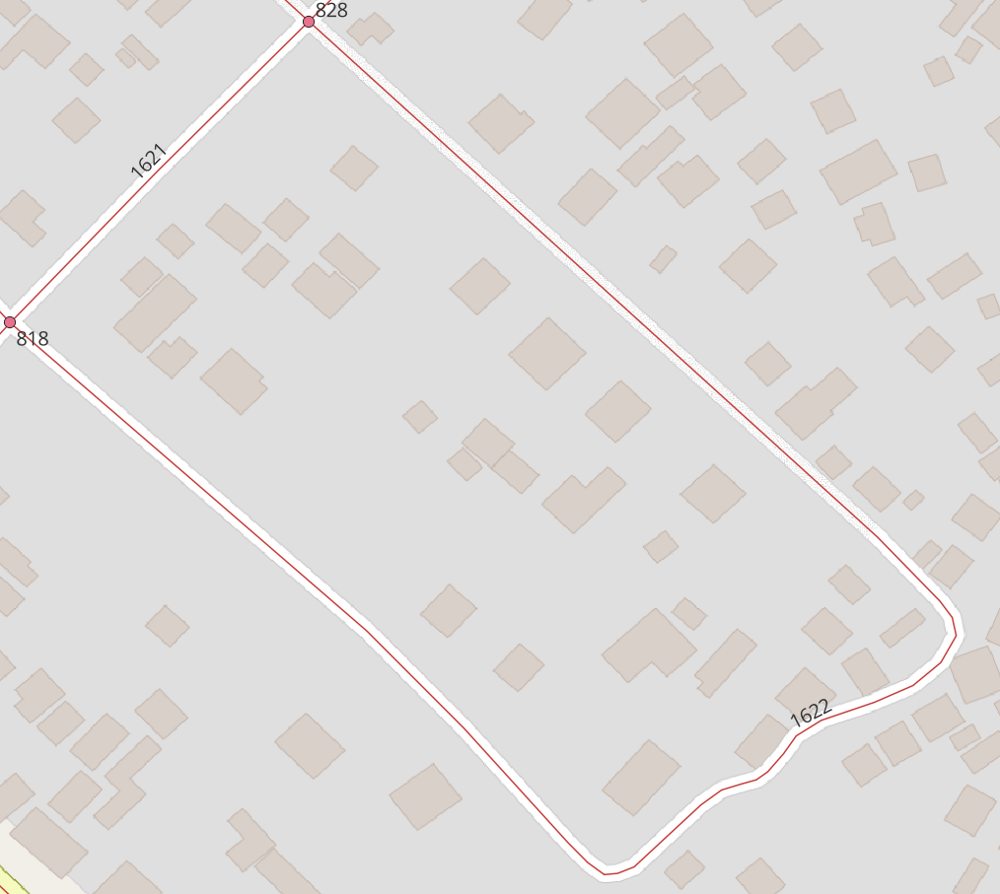

# Origin-Destination, defined origins to destinations

OD analyses aim to determine the most efficient route, either based on distance or time, from specified Origins to Destinations. Origins refer to the starting points or points of origin, and the RA2CE OD-analysis enables users to analyze various combinations of Origins and Destinations based on their specific research interests.

For instance, you can calculate the optimal routes from residential homes to hospitals, or from residential homes to schools. Alternatively, you can find the optimal route from schools to hospitals. The possibilities for analysis vary depending on the particular question you wish to explore.

The following example illustrates the output format, which consists of an origin, a destination, and the corresponding optimal route between them.

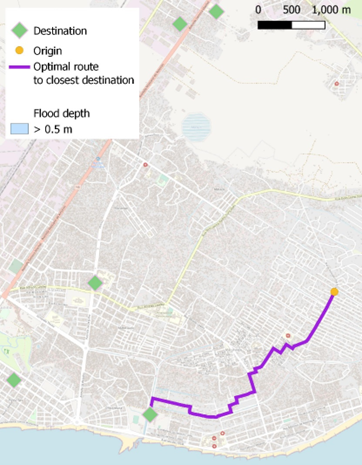

# Emergency response example

This example aims to show how emergency responders could use RA2CE to resopnd to a flood event in Beira. Emergency responders are interested in gaining insights into the locations of the residential areas impacted by the event and accessible routes to locations that will function as shelters during a part of the recovery phase.<br>
<br>

### Creating origins and destinations data

An example: for origins, there are global datasets available in the WorldPop database. These can be used as origin points (after a raster to point conversion manually in GIS). Bear in mind that the origin data needs a specific structure: it should hold an **ID-column** and there should be a field with the **origin_counts** (these can also be 0). 

The same goes for the destinations. The destinations also need an **ID-column** but not an origin count column. Destinations need a **category** column in which you specify the category of a destination. 

OpenStreetMap (OSM) can also be used to extract origin and destination data

Set the CRS to **WGS84** EPSG:4326 for both origin and destination files

After creating this data, the user needs to save the data in the **static / network** folder. 

A **shapefile** format is easiest

Now, to tell RA2CE how to use the origins and destinations, the user needs to specify the file names in the network.ini 

**Network.ini content**
<br>
<br>
> [project]<br>
name = beira<br>
<br>
[network]<br>
directed = False<br>
source = OSM download<br>
primary_file = None<br>
diversion_file = None<br>
file_id = rfid_c<br>
polygon = Extent_Network_wgs84.geojson<br>
network_type = drive<br>
road_types = motorway,motorway_link,primary,primary_link,secondary,secondary_link,tertiary,tertiary_link,residential<br>
save_shp = True<br>
<br>
[origins_destinations]<br>
**origins = origins_worldpop_wgs84.shp<br>
destinations = destinations_all_good_wgs84.shp<br>
origins_names = A<br>
destinations_names = B<br>
id_name_origin_destination = OBJECTID<br>
origin_count = POPULATION<br>                         
origin_out_fraction = 1<br>
category = category**<br>
<br>
*[hazard]<br>
hazard_map = None<br>
hazard_id = None<br>
hazard_field_name = waterdepth<br>
aggregate_wl = max<br>
hazard_crs = None<br>
<br>
[cleanup]<br>
snapping_threshold = None<br>
segmentation_length = None<br>
merge_lines = True<br>
merge_on_id = False<br>
cut_at_intersections = False<br>*


Now we need a flood map! <br>
Noe: the flood map needs to be in **.tif** format

We have an example flood map in our example folder. Let's inspect it!

In [30]:
root_dir = folder_dir / "beira_multi_O_closest_D" #find the right folder
hazard_folder = root_dir/"static"/"hazard"
hazard_map = hazard_folder/"max_flood_depth.tif"

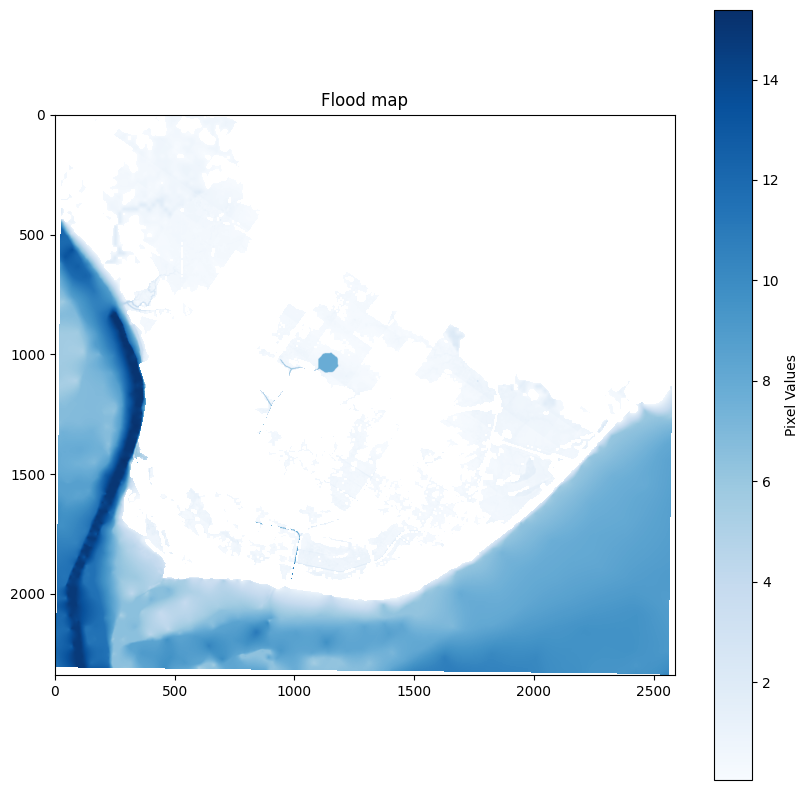

In [26]:
# Open the TIF file using rasterio
with rasterio.open(hazard_map) as src:
    # Read the TIF file as a numpy array
    tif_array = src.read(1)  # Change the band index (1) if necessary

plt.figure(figsize=(10, 10))
plt.imshow(tif_array, cmap='Blues')  # Change the colormap if desired
plt.colorbar(label='Pixel Values')
plt.title('Flood map')
plt.show()


To give the flood map to RA2CE, we need to fill in the **[hazard]** section in the network.ini. 

Specify the flood map name in the **hazard_map** parameter in network.ini. The **aggregate_wl** parameter in analysis.ini can be set to either 'max', 'min' or 'mean' to take the maximum, minimum or mean water depth per road segment when the exposure of the roads to a certain hazard (map) is determined.<br>

Set the right CRS for the flood map in the **hazard_crs** parameter. This CRS can be different from the origins, destinations and road network. RA2CE will reproject the flood map. 

**Network.ini content**
<br>
<br>
> [project]<br>
name = beira<br>
<br>
[network]<br>
directed = False<br>
source = OSM download<br>
primary_file = None<br>
diversion_file = None<br>
file_id = rfid_c<br>
polygon = Extent_Network_wgs84.geojson<br>
network_type = drive<br>
road_types = motorway,motorway_link,primary,primary_link,secondary,secondary_link,tertiary,tertiary_link,residential<br>
save_shp = True<br>
<br>
[origins_destinations]<br>
origins = origins_worldpop_wgs84.shp<br>
destinations = destinations_all_good_wgs84.shp<br>
origins_names = A<br>
destinations_names = B<br>
id_name_origin_destination = OBJECTID<br>
origin_count = POPULATION<br>                         
origin_out_fraction = 1<br>
category = category<br>
<br>
[hazard]<br>
**hazard_map = max_flood_depth.tif**<br>
hazard_id = None<br>
hazard_field_name = waterdepth<br>
**aggregate_wl = max**<br>
**hazard_crs = EPSG:32736**<br>
<br>
*[cleanup]<br>
snapping_threshold = None<br>
segmentation_length = None<br>
merge_lines = True<br>
merge_on_id = False<br>
cut_at_intersections = False<br>*


In this example, educational institutes and hospitals are considered destinations after the flood (as shelters). You can inspect these files in QGIS. We will also load them here:

We need to update our network and analysis initialisation files, which include Origin-Destination (OD) matrix and **optimal_route_origin_closest_destination** analysis, respectively.
Navigate to the folder in which you want to perform this analysis, and change the network.ini and the analysis.ini accordingly.

*Notice how you can keep the [network] parameters the same. RA2CE will automatically use the graph you have already created. Or, if you want to create a new graph, it can run both processes consecutively*

**Analysis.ini content**
<br>
<br>
> [project] <br>
name = beira <br>
<br>
[analysis1]<br>
name = multi-link origin closest destination<br>
analysis = multi_link_origin_closest_destination<br>
aggregate_wl = max<br>
threshold = 0.5<br>
weighing = distance<br>
calculate_route_without_disruption = True<br>
save_shp = True<br>
save_csv = True<br>
<br>

In [12]:
root_dir = folder_dir/'beira_multi_O_closest_D'

network_ini = root_dir / _network_ini_name
assert network_ini.is_file()

analysis_ini = root_dir / _analysis_ini_name
assert analysis_ini.is_file()

Initialise and run the test.<br>
Notice the information RA2CE gives you. Education is D1 and hopsital D2

In [13]:
handler = Ra2ceHandler(network=network_ini, analysis=analysis_ini)
handler.configure()
handler.run_analysis()

2023-06-20 02:54:26 PM - [ra2ce_logging.py:41] - root - INFO - RA2CE logger initialized.
2023-06-20 02:54:26 PM - [network_config.py:118] - root - INFO - Existing graph/network found: C:\python\examples\examples\beira_multi_O_closest_D\static\output_graph\base_graph.p.
2023-06-20 02:54:26 PM - [network_config.py:118] - root - INFO - Existing graph/network found: C:\python\examples\examples\beira_multi_O_closest_D\static\output_graph\base_network.feather.
2023-06-20 02:54:26 PM - [network_config.py:118] - root - INFO - Existing graph/network found: C:\python\examples\examples\beira_multi_O_closest_D\static\output_graph\origins_destinations_graph.p.
2023-06-20 02:54:26 PM - [network_config.py:118] - root - INFO - Existing graph/network found: C:\python\examples\examples\beira_multi_O_closest_D\static\output_graph\base_graph_hazard.p.
2023-06-20 02:54:26 PM - [network_config.py:118] - root - INFO - Existing graph/network found: C:\python\examples\examples\beira_multi_O_closest_D\static\ou

In [ ]:
analysis_output_path = root_dir / r'output\multi_link_origin_closest_destination'
gdf = gpd.read_file(analysis_output_path / 'multilink_origin_closest_dest_origins.gpkg')
gdf.explore(column='education', cmap=['green', 'red'])

In [ ]:
output_path = root_dir /"output"/"optimal_route_origin_destination" #set the path to the output folder of the analysis
output_graph_path = root_dir/"static"/ "output_graph" #set the path to the output_graph folder which holds the road network 

In [ ]:

base_edges_gdf = gpd.read_file(output_graph_path/'base_graph_edges.gpkg')
base_edges_gdf['grey_links_legend'] = 'All links'
base_edges_map = base_edges_gdf.explore(column='grey_links_legend', tiles="CartoDB positron", cmap=['grey'])

optimal_route_od_filtered_gdf = gpd.read_file(output_path / r'optimal_route_od_filtered.gpkg')
optimal_route_od_filtered_gdf['blue_links_legend'] = 'Optimal routes'
optimal_route_od_filtered_map = optimal_route_od_filtered_gdf.explore(m=base_edges_map, column='blue_links_legend', 
                                                                      tiles="CartoDB positron", cmap=['blue'])

origins_filtered_gdf = gpd.read_file(output_path / r'origins_filtered.gpkg')
origins_filtered_gdf['red_node_legend'] = 'Origin A_257'
origins_filtered_map = origins_filtered_gdf.explore(m=optimal_route_od_filtered_map, column='red_node_legend',
                                                    tiles="CartoDB positron", cmap=['red'], marker_kwds={'radius':7})

destinations_gdf = gpd.read_file(output_path / r'destinations.gpkg')
destinations_gdf['green_nodes_legend'] = 'Destinations'
origins_filtered_map = destinations_gdf.explore(m=origins_filtered_map, column='green_nodes_legend',
                                                tiles="CartoDB positron", cmap=['green'], marker_kwds={'radius':7})

display(origins_filtered_map)


> Now assume a flood event. We perform the **multi_link_origin_closest_destination** analysis to determine what the closest non-disrupted accessible destination is for each origin given the hazard, compared to the situation without a hazard, including the route.

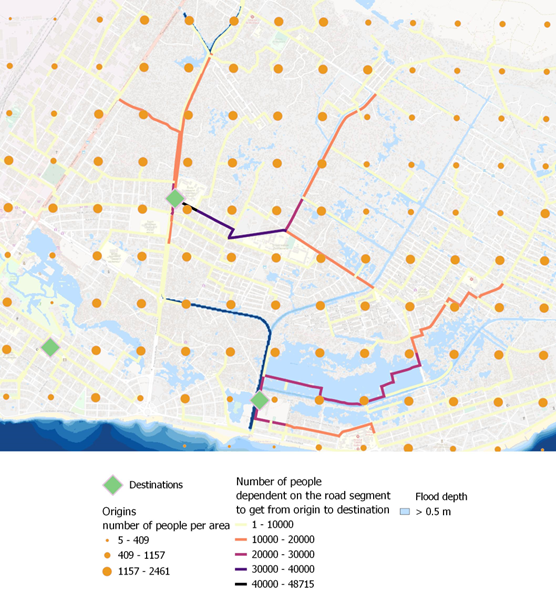

> Let's perform such an analysis. Initialising the .ini files happen in the same way as in the previous examples. For this example, we need a flood map (max_flood_depth.tif in network.ini) and a maximum water depth threshold (threshold in analysis.ini in meters) from which road segments become dysfunctional. Moreover, the aggregate_wl parameter in analysis.ini can be set to either 'max', 'min' or 'mean' to take the maximum, minimum or mean water depth per road segment when the exposure of the roads to a certain hazard (map) is determined.<br>
<br>
Bellow the configured base graph edges, origins (light yellow nodes), destinations, and flood map are presented. Demand nodes are derived from a raster file representing the region's population. That is the reason behind their grid-like placements.

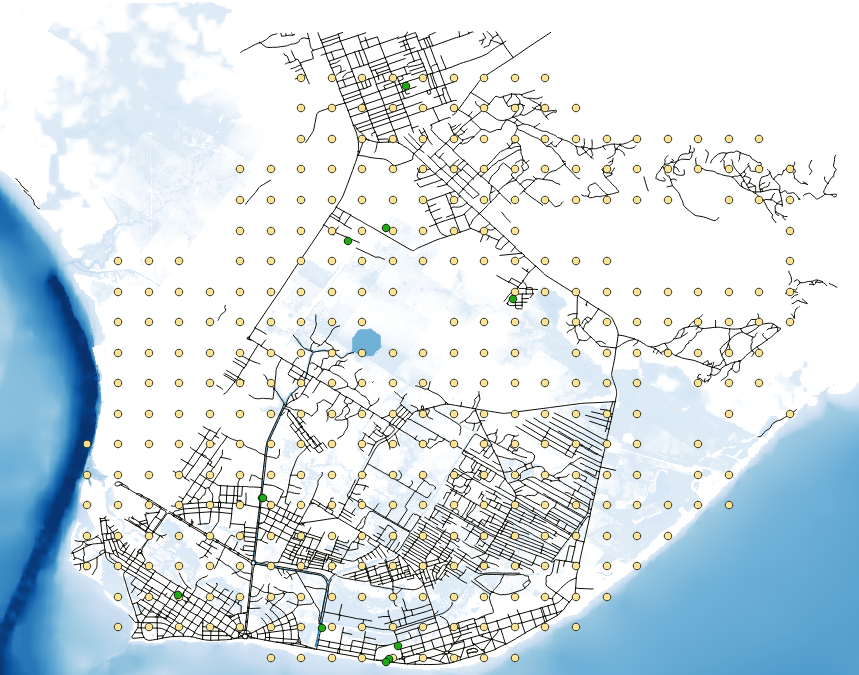

**Network.ini content**
<br>
<br>
> [project]<br>
name = beira<br>
<br>
[network]<br>
directed = False<br>
source = OSM download<br>
primary_file = None<br>
diversion_file = None<br>
file_id = rfid_c<br>
polygon = Extent_Network_wgs84.geojson<br>
network_type = drive<br>
road_types = motorway,motorway_link,primary,primary_link,secondary,secondary_link,tertiary,tertiary_link,residential<br>
save_shp = True<br>
<br>
[origins_destinations]<br>
origins = origins_worldpop_wgs84.shp<br>
destinations = destinations_all_good_wgs84.shp<br>
origins_names = A<br>
destinations_names = B<br>
id_name_origin_destination = OBJECTID<br>
origin_count = POPULATION<br>                         
origin_out_fraction = 1<br>
category = category<br>
<br>
[hazard]<br>
hazard_map = max_flood_depth.tif<br>
hazard_id = None<br>
hazard_field_name = waterdepth<br>
aggregate_wl = max<br>
hazard_crs = EPSG:32736<br>
<br>
*[cleanup]<br>
snapping_threshold = None<br>
segmentation_length = None<br>
merge_lines = True<br>
merge_on_id = False<br>
cut_at_intersections = False<br>*


**analysis.ini content**
<br>
<br>
> [project]<br>
name = beira<br>
<br>
[analysis1]<br>
name = multilink origin closest dest<br>
analysis = multi_link_origin_closest_destination<br>
aggregate_wl = max<br>
threshold = 0.5<br>
weighing = distance<br>
calculate_route_without_disruption = True<br>
save_shp = True<br>
save_csv = True<br>

In [ ]:
root_dir = Path(r'C:\repos\ra2ce\examples\beira_multi_o_closest_d')

network_ini = root_dir / _network_ini_name
assert network_ini.is_file()

analysis_ini = root_dir / _analysis_ini_name
assert analysis_ini.is_file()

> Configure and run:

In [ ]:
handler = Ra2ceHandler(network=network_ini, analysis=analysis_ini)
handler.configure()
handler.run_analysis()

> Now we can explore which origins have access to the destinations (in multilink_origin_closest_dest_origins.gpkg), or available optimal routes from all origins to all destinations, with the number of people using the links under the impact of the introduced hazard (in multilink_origin_closest_dest_optimal_routes_with_hazard.gpkg).

> We visualise the access/no-access states of the origins of educational institutes:

In [ ]:
analysis_output_path = root_dir / r'output\multi_link_origin_closest_destination'
gdf = gpd.read_file(analysis_output_path / 'multilink_origin_closest_dest_origins.gpkg')
gdf.explore(column='education', cmap=['green', 'red'])

> Here, the optimal routes of the A_1 origin to the closest destinations (educational institute and hospital) are visualised.

> Moreover, all optimal routes to B_5 hospital (blue node) destination are demonstrated.

In [ ]:
analysis_output_path = root_dir / r'output\multi_link_origin_closest_destination'
origin_gdf = gpd.read_file(analysis_output_path / 'multilink_origin_closest_dest_origins.gpkg')
destinations_gdf = gpd.read_file(analysis_output_path / 'multilink_origin_closest_dest_destinations.gpkg')
optimal_routes_gdf = gpd.read_file(analysis_output_path / 'multilink_origin_closest_dest_optimal_routes_with_hazard.gpkg')

b_5_gdf = destinations_gdf[destinations_gdf['d_id']=='B_5']
optimal_routes_b_5_gdf = optimal_routes_gdf[optimal_routes_gdf['destination'] == 'B_5']
origins_with_optimal_route_b_5 = origin_gdf[origin_gdf['o_id'].isin(optimal_routes_b_5_gdf['origin'])]

optimal_routes_b_5_map = optimal_routes_b_5_gdf.explore(color='black')
b_5_map = b_5_gdf.explore(m=optimal_routes_b_5_map, color='blue', marker_kwds={'radius':5})
origins_with_optimal_route_b_5.explore(m=b_5_map, color='green', marker_kwds={'radius':5})


# Elaborate example: emergency response

> This example aims to support delivering emergency responses to a flood event in Beira. Emergency responders are interested in gaining insights into the locations of the residential areas impacted by the event, accessible routes to locations that will function as shelters during a part of the recovery phase, and isolated residential areas.<br>
<br>
In this example, educational institutes and hospitals are considered destinations after the flood (as shelters).

> We first identify the required analysis sets. The required insights can be answered by accessibility analysis.<br>
<br>
> 1. To analyse finds the sections of the network that are fully isolated from the rest of the network (also named disconnected islands) due to the hazard-induced disruption, we run the multi_link_isolated_locations analysis. A location is considered ‘isolated’ when part of a fully isolated network (a disconnected island) but not directly affected by the hazard.<br>
<br>
> 2. To determine what the closest non-disrupted accessible destination is for each origin given the hazard, we use multi_link_origin_closest_destination in analyses.ini. This analysis outputs the residential areas which have access to the shelter destinations.
<br>

> Bellow, the networ.ini and analysis.ini are presented respectively:

> [project]<br>
name = beira_emergency_response<br>
<br>
[network]<br>
directed = False<br>
source = OSM download<br>
primary_file = None<br>
diversion_file = None<br>
file_id = rfid_c<br>
polygon = Extent_Network_wgs84.geojson<br>
network_type = drive<br>
road_types = motorway,motorway_link,trunk,trunk_link,primary,primary_link,secondary,secondary_link,tertiary,tertiary_link,unclassified,residential<br>
save_shp = True<br>
<br>
[origins_destinations]<br>
origins = origins_worldpop_wgs84.shp<br>
destinations = destinations_all_good_wgs84.shp<br>
origins_names = A<br>
destinations_names = B<br>
id_name_origin_destination = OBJECTID<br>
origin_count = POPULATION           <br>              
origin_out_fraction = 1<br>
category = category<br>
<br>
[hazard]<br>
hazard_map = max_flood_depth.tif<br>
hazard_id = None<br>
hazard_field_name = waterdepth<br>
aggregate_wl = max<br>
hazard_crs = EPSG:32736<br>
<br>
[isolation]<br>
locations = origins_worldpop_wgs84.shp *# This is needed to investigate the isolated areas* <br>
<br>
*[cleanup]<br>
snapping_threshold = None<br>
pruning_threshold = None<br>
segmentation_length = None<br>
merge_lines = None<br>
ignore_intersections = None<br>*


> [project]<br>
name = beira_emergency_response<br>
<br>
[analysis1]<br>
name = multi-link origin dest test<br>
analysis = multi_link_origin_destination<br>
aggregate_wl = max<br>
threshold = 0.5<br>
weighing = distance<br>
save_shp = True<br>
save_csv = True<br>
<br>
[analysis2]<br>
name = multi-link origin closest destination<br>
analysis = multi_link_origin_closest_destination<br>
aggregate_wl = max<br>
threshold = 0.5<br>
weighing = distance<br>
calculate_route_without_disruption = True<br>
save_shp = True<br>
save_csv = True<br>
<br>
[analysis3]<br>
name = multi-link isolated locations<br>
analysis = multi_link_isolated_locations<br>
aggregate_wl = max<br>
threshold = 0.5<br>
weighing = length<br>
buffer_meters = 500<br>
category_field_name = category<br>
save_shp = True<br>
save_csv = True<br>

> We introduce, configure and run the analysis sets:

In [ ]:
root_dir = Path(r'C:\repos\ra2ce\examples\beira_emergency_response')

network_ini = root_dir / _network_ini_name
assert network_ini.is_file()

analysis_ini = root_dir / _analysis_ini_name
assert analysis_ini.is_file()

In [ ]:
handler = Ra2ceHandler(network=network_ini, analysis=analysis_ini)
handler.configure()
handler.run_analysis()

> **multi_link_isolated_locations results:**

 > 1. *residential areas flooded (> 0.5 m) with waterdepth information and corresponding population in each node's attributes:* Red nodes represent the inundated residential regions.

In [ ]:
analysis_output_path = root_dir / r'output\multi_link_isolated_locations'

affected_origins_gdf = gpd.read_file(analysis_output_path / 'multilink_isolated_locations.gpkg')
affected_origins_gdf['inundated'] = affected_origins_gdf['EV1_ma'].apply(lambda x: '1' if x > 0.5 else '0')

affected_origins_gdf.explore(column='inundated', cmap=['green', 'red'], tiles="CartoDB positron")

> 2. *Isolated residential areas:* <br>
<br> This analysis finds the sections of the network that are fully isolated from the rest of the network (also named disconnected islands), because of network disruption due to a hazard. These locations are not necessarily inundated, but are isolated as disconnected from the larger network due to flooding elsewhere. 

<br>

**Issue with the following map** as if we are passing float, it neads a color spectrum!

In [ ]:
affected_origins_gdf.explore(column='i_EV1', legend=False, tiles="CartoDB positron")

affected_origins_gdf['isolated'] = affected_origins_gdf['i_EV1'].apply(lambda x: '1' if x == 1 else '0')

affected_origins_gdf.explore(column='isolated', cmap=['green', 'red'], tiles="CartoDB positron")

> We overlay the accessible/not-accessible and isolated/connected analysis layers on top of each other. Filled circles show whether the areas are inundated (red and green, respectively). Circles without area colours show whether the areas are isolated (red and green, respectively). By this means, we can trace both inundated and isolated areas.

> Thereafter, we overlay the available roads (green-coloured links), meaning that the maximum water depth is 0.5 meters or lower (threshold in the network.ini).

> Additionally, we overlay the roads that are inundated with a maximum water level of above 0.5 meters on the available road network (green-coloured links).

In [ ]:
inundated_map = affected_origins_gdf.explore(column='inundated', cmap=['darkgreen', 'darkred'], marker_type="circle_marker"
                                             , marker_kwds={'radius':2}, legend=False, tiles="CartoDB positron")
isolated_inundated_map = affected_origins_gdf.explore(m=inundated_map, column='isolated', cmap=['darkgreen', 'darkred'],
                             marker_type="circle", marker_kwds={'radius':150}, legend=False)
display(isolated_inundated_map)

inundated_map = affected_origins_gdf.explore(column='inundated', cmap=['darkgreen', 'darkred'], marker_type="circle_marker"
                                             , marker_kwds={'radius':2}, legend=False)
roads_gdf = gpd.read_file(root_dir / r'static\output_graph\base_graph_hazard_edges.gpkg')
impacted_roads_gdf = roads_gdf[roads_gdf['EV1_ma'] > 0.5]

open_roads_gdf = roads_gdf[roads_gdf['EV1_ma'] <= 0.5]
open_roads_map = open_roads_gdf.explore(m=isolated_inundated_map, color='green')
display(open_roads_map)

impacted_roads_map = impacted_roads_gdf.explore(tiles='CartoDB dark_matter',m=isolated_inundated_map, column='EV1_ma',
                                                cmap='cool', legend_kwds={'caption':'water depth (m)'})
display(impacted_roads_map)

> **multi_link_origin_closest_destination results:**

1. *the access of the residential areas to each type of destination:* We show the residential areas without access to the destinations.

In [ ]:
analysis_output_path = root_dir / r'output\multi_link_origin_closest_destination'

origins_gdf = gpd.read_file(analysis_output_path / 'multilink_origin_closest_dest_origins.gpkg')
no_access_gdf = origins_gdf[origins_gdf['EV1_ma_AD1']=='no access']

no_access_gdf.explore(column='POPULATION', cmap='cool', marker_kwds={'radius':5}, tiles="CartoDB positron")

> 2. *the expected usage levels of the destination nodes:* We present the demand for the accessible destinations (hospitals and educational institutions).

In [ ]:
analysis_output_path = root_dir / r'output\multi_link_origin_closest_destination'

destinations_gdf = gpd.read_file(analysis_output_path / 'multilink_origin_closest_dest_destinations.gpkg')
destinations_gdf['demand'] = destinations_gdf['EV1_ma_PD1'] + destinations_gdf['EV1_ma_PD2'].fillna(0)
accessible_destinations_gdf = destinations_gdf[destinations_gdf['demand'] > 0]

accessible_destinations_gdf.explore(column='demand', cmap='cool', marker_kwds={'radius':5}, tiles="CartoDB positron")

> 3. Bellow, we visualise all optimal routes to accessible destinations.

In [ ]:
analysis_output_path = root_dir / r'output\multi_link_origin_closest_destination'

optimal_routes_hazard_gdf = \
        gpd.read_file(analysis_output_path / 'multilink_origin_closest_dest_optimal_routes_with_hazard.gpkg')
destinations_gdf = gpd.read_file(analysis_output_path / 'multilink_origin_closest_dest_destinations.gpkg')

cmap = get_cmap()
colors = cmap.colors

for i, accessible_destination in enumerate(set(optimal_routes_hazard_gdf['destination'].to_numpy())):
    optimal_routes_destination_gdf = \
        optimal_routes_hazard_gdf[optimal_routes_hazard_gdf['destination'] == accessible_destination]
    color = random.choice(colors)
    layer_color = to_hex(color)
    if i == 0:
        combined_node_link_map = optimal_routes_destination_gdf.explore(color=layer_color, tiles="CartoDB positron")
    else:
        combined_node_link_map = optimal_routes_destination_gdf.explore(m=combined_node_link_map,
                                                                        color=layer_color)
    destination_gdf = destinations_gdf[destinations_gdf['d_id'] == accessible_destination]
    combined_node_link_map = destination_gdf.explore(m=combined_node_link_map, color=layer_color,
                                                     marker_kwds={'radius': 5})
    
display(combined_node_link_map)